Code for **"Blind restoration of a JPEG-compressed image"** and **"Blind image denoising"** figures. Select `fname` below to switch between the two.

- To see overfitting set `num_iter` to a large value.

In [ ]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
# !git clone https://github.com/DmitryUlyanov/deep-image-prior
# !mv deep-image-prior/* ./

In [1]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [2]:
%cd /

/


In [3]:
%cd gdrive/MyDrive/

/gdrive/MyDrive


# Import libs

In [4]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 50
sigma_ = sigma/255.

# Load image

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  This is separate from the ipykernel package so we can avoid doing imports until


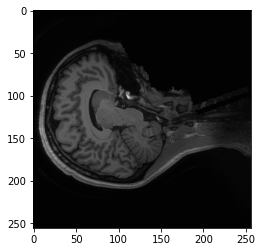

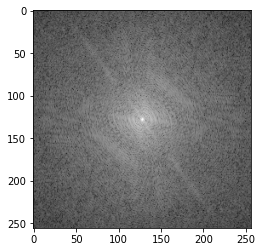

In [5]:
import nibabel as nib
img = nib.load('HCP_mgh_1001_MR_MPRAGE_GradWarped_and_Defaced_Br_20140919084711597_S227198_I444246.nii')
img_data = img.get_data()
img_data_arr = np.asarray(img_data)
test_1=img_data_arr[:,:,88+9]
plt.imshow(test_1,cmap='gray')
plt.figure()
data = test_1.astype(np.float32)
img_torch = torch.from_numpy(data)
fft_img_torch = torch.fft.fft2(img_torch,norm="ortho")
fft_img_torch = torch.fft.fftshift(fft_img_torch) 
plt.imshow(20*np.log(torch.abs(fft_img_torch)),cmap='gray')

In [6]:
def row_Mask_test(image,c_level):
  import random
  import math
  [row,col]=image.shape
  if row%2 ==0 :
    r = np.uint8(row/2)
  else :
    r = np.uint8((row+1)/2)
  img_mask_np=np.ones([row,col])
  n = row - row/c_level
  N=random.sample(range(1, row), math.ceil(n))
  for j in N:
    if j in range(r-15,r+15):
      continue
    img_mask_np[:,j]=np.zeros([1,col])
  return img_mask_np

**2X Compression**

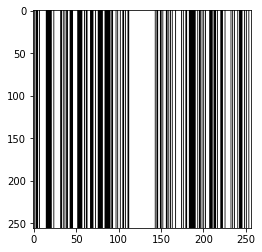

In [7]:
Mask_1=row_Mask_test(img_torch,2)
mask_tensor=torch.from_numpy(Mask_1.astype(np.float32))
plt.imshow(Mask_1,cmap='gray')



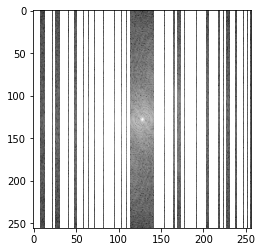

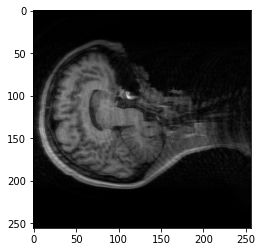

In [8]:

compressed_img_fft=torch.multiply(mask_tensor,fft_img_torch)
plt.figure()
plt.imshow(20*torch.log(torch.abs(compressed_img_fft)),cmap='gray')

compressed_img = torch.fft.ifft2(torch.fft.ifftshift(compressed_img_fft))
plt.figure()
plt.imshow((torch.abs(compressed_img)),cmap='gray')

In [9]:
compressed_img = compressed_img.detach().cpu().numpy()

In [10]:
img_noisy_np = np.copy(np.abs(compressed_img))
img_np = np.copy(data)

In [11]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99
   
   
num_iter = 2000
input_depth = 32 
figsize = 4 
    
    
net = get_net(input_depth, 'skip', pad,skip_n33d=128,skip_n33u=128,skip_n11=4, num_scales=5,upsample_mode='bilinear').type(dtype)

net_input = get_noise(input_depth, INPUT, (256, 256)).type(dtype).detach()

s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)
# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 2217831


# Optimize

Starting optimization with ADAM


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:528: UserWarning: Using a target size (torch.Size([1, 256, 256])) that is different to the input size (torch.Size([1, 3, 256, 256])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipyker

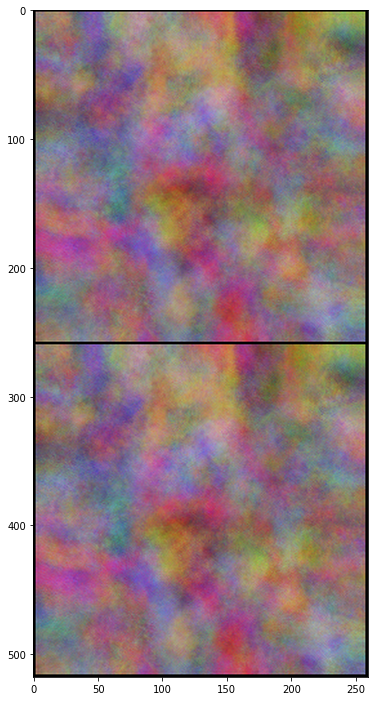

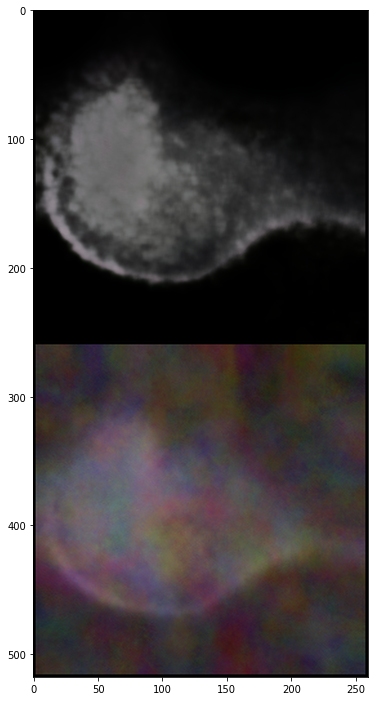

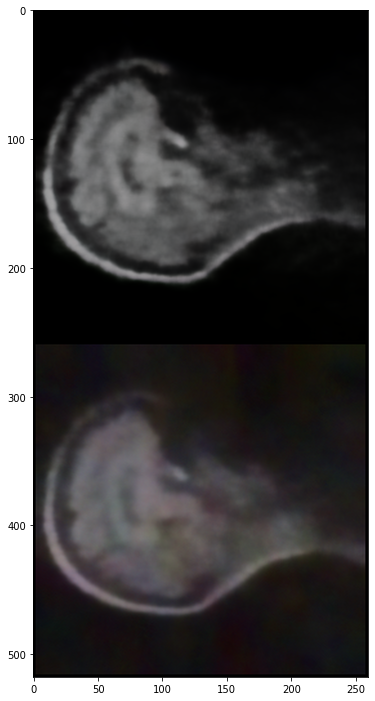

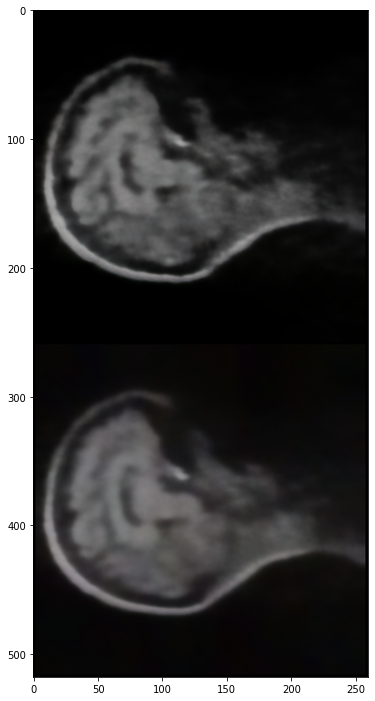

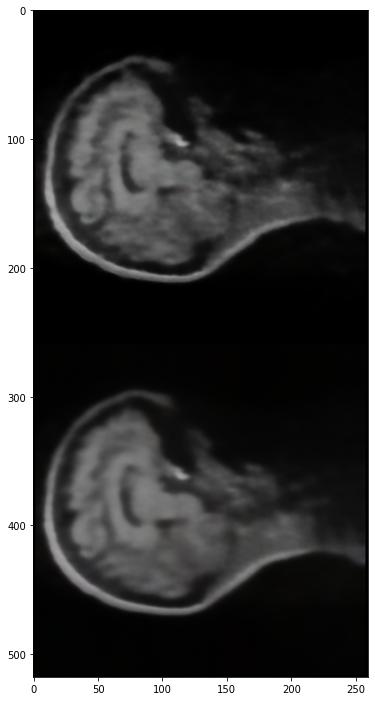

...

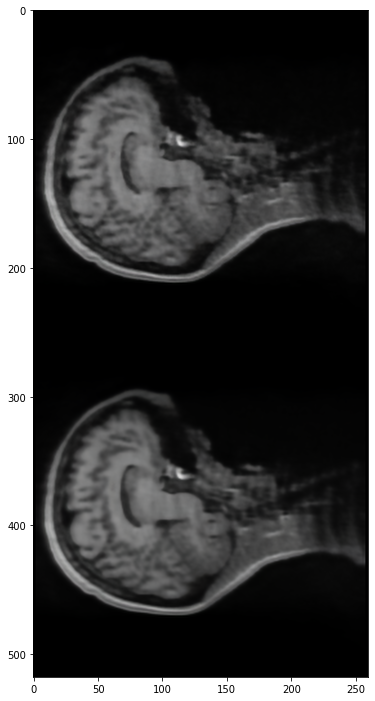

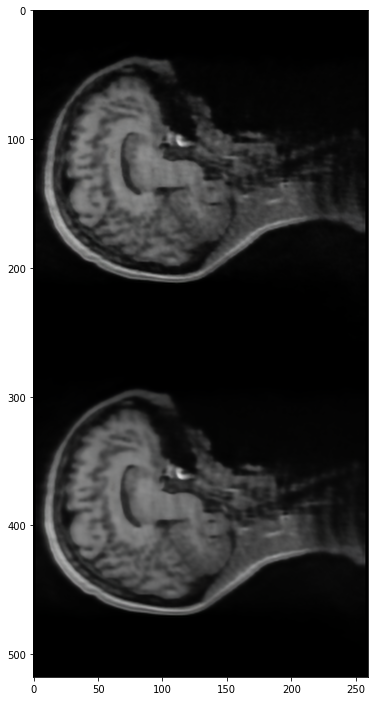

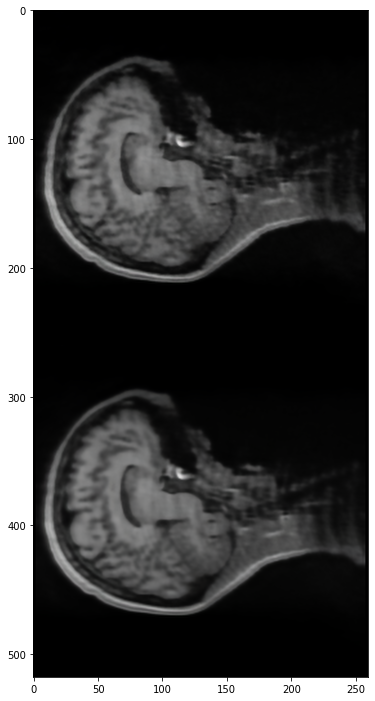

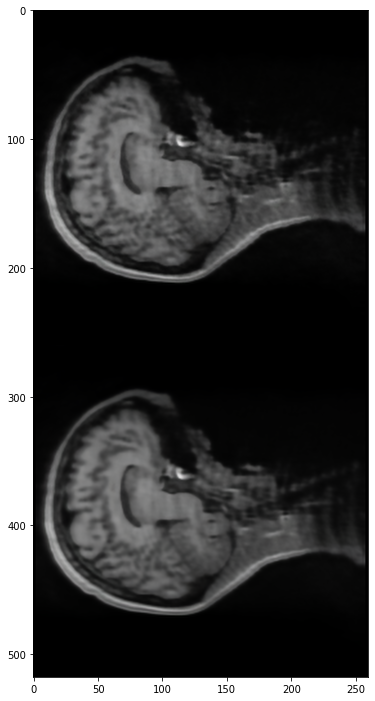

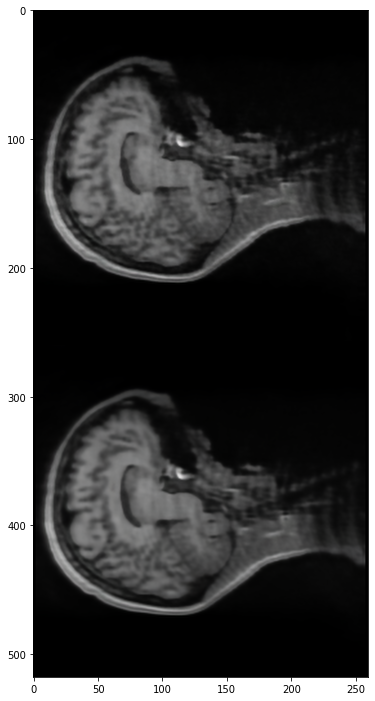

In [12]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

i = 0
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
    
    tanvi = out.detach().cpu().numpy()[0]
    
    psrn_noisy = compare_psnr(img_noisy_np, tanvi[0],data_range = img_noisy_np.min()-img_noisy_np.max())
    psrn_gt    = compare_psnr(img_np, tanvi[0],data_range = img_np.min()-img_np.max()) 
    psrn_gt_sm = compare_psnr(img_np, tanvi[0],data_range = img_np.min()-img_np.max()) 
    
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
    out_np = torch_to_np(out)
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        
        
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


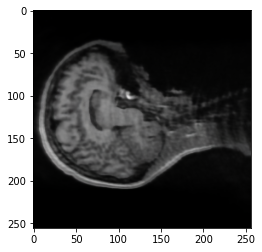

In [13]:
out_np = torch_to_np(net(net_input))
Out=np.zeros((out_np.shape[1],out_np.shape[2],3))
Out[:,:,0]=out_np[0]
Out[:,:,1]=out_np[1]
Out[:,:,2]=out_np[2]
plt.imshow(Out ,cmap='gray')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


Reconstructed image PSNR: 22.123586150466096
Orginal compressed image PSNR: 26.26750910264084
Reconstructed image SSIM: 0.8161142969386999
Orginal compressed image SSIM: 0.8674484002926316


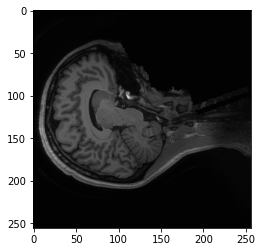

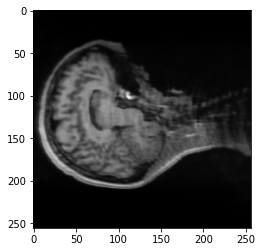

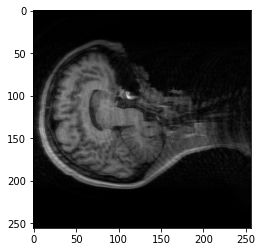

In [14]:
from skimage import color
from skimage import io
import cv2
from skimage.measure import compare_ssim

img_np = cv2.normalize(img_np, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
img = color.rgb2gray(Out)
img = cv2.normalize(img, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
img_noisy_np = cv2.normalize(img_noisy_np, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
plt.figure()
plt.imshow(img_np ,cmap='gray')
plt.figure()
plt.imshow(img ,cmap='gray')
plt.figure()
plt.imshow(img_noisy_np ,cmap='gray')
print("Reconstructed image PSNR:",compare_psnr(img_np, img))
print("Orginal compressed image PSNR:",compare_psnr(img_np, img_noisy_np))
print("Reconstructed image SSIM:",compare_ssim(img_np, img))
print("Orginal compressed image SSIM:",compare_ssim(img_np, img_noisy_np))





In [ ]:
img = color.rgb2gray(Out)

Img          255.0 0.0
Original Lap 330.68542 -222.53413
Scaled Lap   100.0 -67.294815
SharpImg     339.21594 -51.193382
SharpImg abs 339.21594 6.122282e-07
SharpImg after scaling 255.0 4.6023246e-07


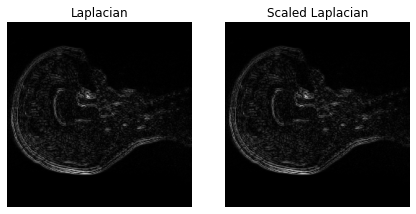

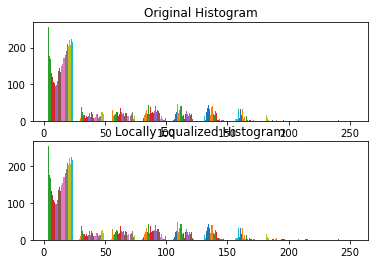

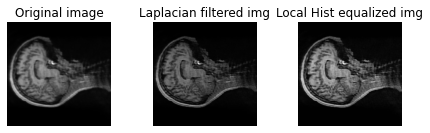

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import scipy.misc
import scipy.ndimage.filters
import cv2

#Function for plotting abs:
pic_n       = 1
def show_abs(I, plot_title):
    plt.title(plot_title)
    plt.tight_layout()
    plt.axis('off')
    plt.imshow(abs(I), cm.gray)

#Reading of the image into numpy array:
A0           = img
A0          -= np.amin(A0)#map values to the (0, 255) range
A0          *= 255.0/np.amax(A0)
print('Img         ', np.amax(A0), np.amin(A0))
#>>> Img          255.0 0.0

#Kernel for negative Laplacian
kernel      = np.ones((3,3))*(-1)
kernel[1,1] = 8

#Convolution of the image with the kernel:
Lap        = scipy.ndimage.filters.convolve(A0, kernel)

#Laplacian now has negative values
print('Original Lap', np.amax(Lap), np.amin(Lap))
#>>> Original Lap 1151.0 -1166.0

#Map Laplacian to some new range:
Laps        = Lap*100.0/np.amax(Lap) #Sharpening factor!
print('Scaled Lap  ', np.amax(Laps), np.amin(Laps))
#>>> Scaled Lap   100.0 -101.303

plt.figure(pic_n)
pic_n += 1
plt.subplot(1,2,1)
show_abs(Lap, 'Laplacian')
plt.subplot(1,2,2)
show_abs(Laps, 'Scaled Laplacian')

A           = A0 + Laps #Add negative Laplacian to the original image

print('SharpImg    ', np.amax(A), np.amin(A))
#>>> SharpImg     350.917 -81.06

A = abs(A) #Get rid of negative values
print('SharpImg abs', np.amax(A), np.amin(A))

A           *= 255.0/np.amax(A)
print('SharpImg after scaling', np.amax(A), np.amin(A))
#>>> SharpImg abs 350.917 0.0

# Local Histogram Equalization with OpenCV:
A_cv2       = A
A_cv2       = A_cv2.astype(np.uint8)

tile_s0     = 4
tile_s1     = 4

clahe       = cv2.createCLAHE(clipLimit=1, tileGridSize=(tile_s0,tile_s1))
A_cv2       = clahe.apply(A_cv2)

plt.figure(pic_n)
pic_n += 1
plt.subplot(2,1,1)
plt.hist(A_cv2)
plt.title('Original Histogram')
plt.subplot(2,1,2)
plt.hist(A_cv2)
plt.title('Locally Equalized Histogram')

plt.figure(pic_n)
pic_n += 1
plt.subplot(1,3,1)
show_abs(A0, 'Original image')
plt.subplot(1,3,2)
show_abs(A, 'Laplacian filtered img')
plt.subplot(1,3,3)
show_abs(A_cv2, 'Local Hist equalized img')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


Reconstructed image PSNR: 28.51748377744328
Orginal compressed image PSNR: 26.26750910264084
Reconstructed image SSIM: 0.849695804777992
Orginal compressed image SSIM: 0.8674484002926316


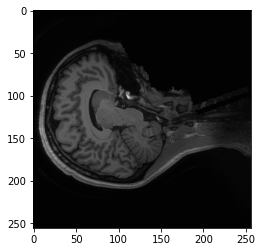

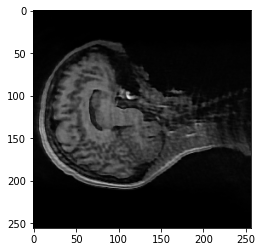

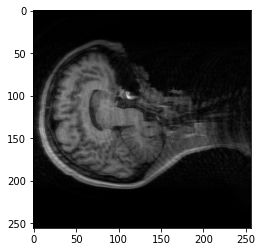

In [16]:
from skimage import color
from skimage import io
import cv2
from skimage.measure import compare_ssim

img_np = cv2.normalize(img_np, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
img = color.rgb2gray(Out)
img = cv2.normalize(A, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
img_noisy_np = cv2.normalize(img_noisy_np, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
plt.figure()
plt.imshow(img_np ,cmap='gray')
plt.figure()
plt.imshow(img ,cmap='gray')
plt.figure()
plt.imshow(img_noisy_np ,cmap='gray')
print("Reconstructed image PSNR:",compare_psnr(img_np, img))
print("Orginal compressed image PSNR:",compare_psnr(img_np, img_noisy_np))
print("Reconstructed image SSIM:",compare_ssim(img_np, img))
print("Orginal compressed image SSIM:",compare_ssim(img_np, img_noisy_np))





**4X Compression**

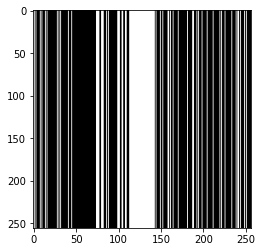

In [17]:
Mask_1=row_Mask_test(img_torch,4)
mask_tensor=torch.from_numpy(Mask_1.astype(np.float32))
plt.imshow(Mask_1,cmap='gray')

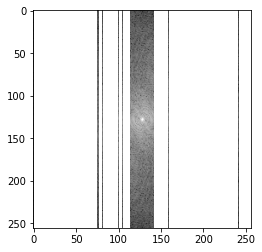

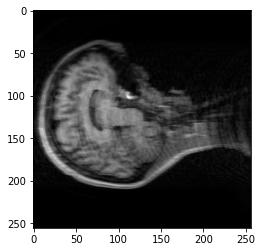

In [18]:

compressed_img_fft=torch.multiply(mask_tensor,fft_img_torch)
plt.figure()
plt.imshow(20*torch.log(torch.abs(compressed_img_fft)),cmap='gray')

compressed_img = torch.fft.ifft2(torch.fft.ifftshift(compressed_img_fft))
plt.figure()
plt.imshow((torch.abs(compressed_img)),cmap='gray')

In [19]:
compressed_img = compressed_img.detach().cpu().numpy()

In [20]:
img_noisy_np = np.copy(np.abs(compressed_img))
img_np = np.copy(data)

In [21]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99
   
   
num_iter = 2000
input_depth = 32 
figsize = 4 
    
    
net = get_net(input_depth, 'skip', pad,skip_n33d=128,skip_n33u=128,skip_n11=4, num_scales=5,upsample_mode='bilinear').type(dtype)

net_input = get_noise(input_depth, INPUT, (256, 256)).type(dtype).detach()

s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)
# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 2217831


Starting optimization with ADAM


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:528: UserWarning: Using a target size (torch.Size([1, 256, 256])) that is different to the input size (torch.Size([1, 3, 256, 256])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipyker

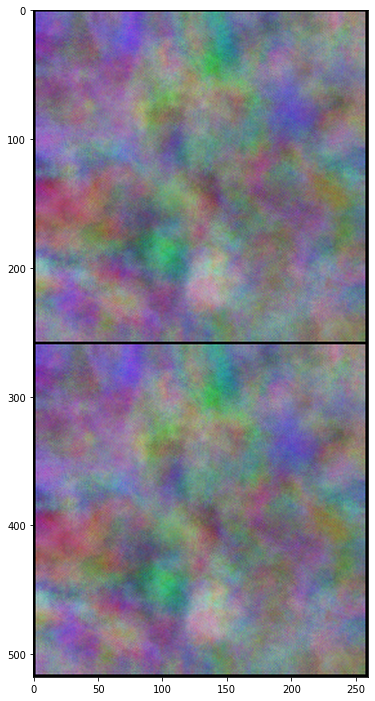

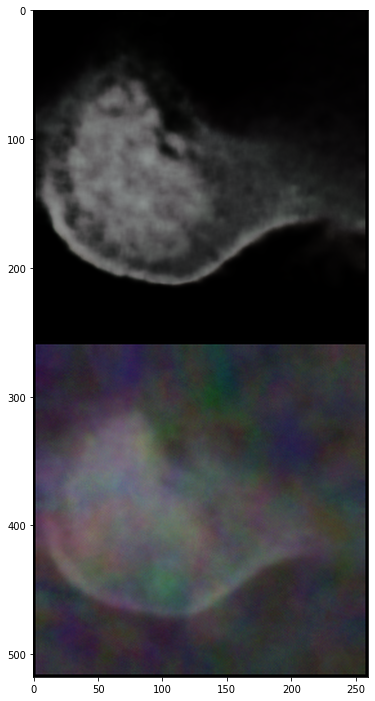

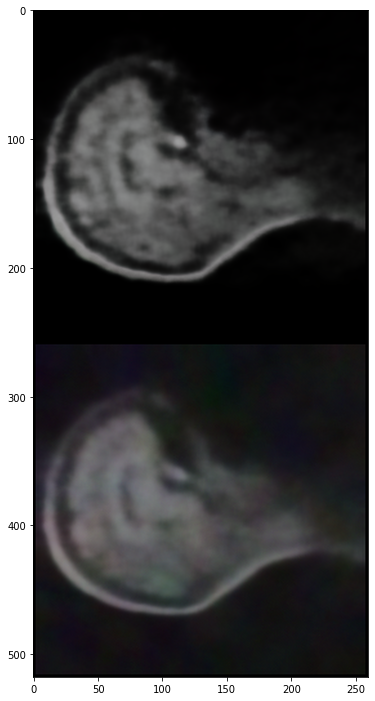

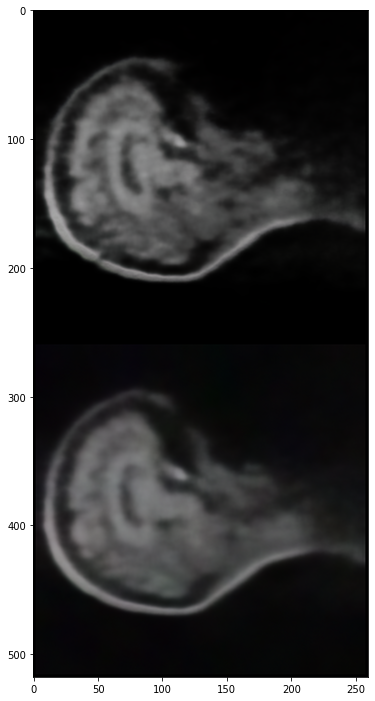

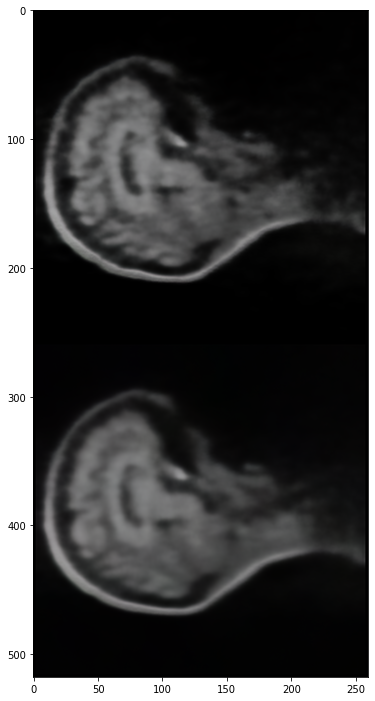

...

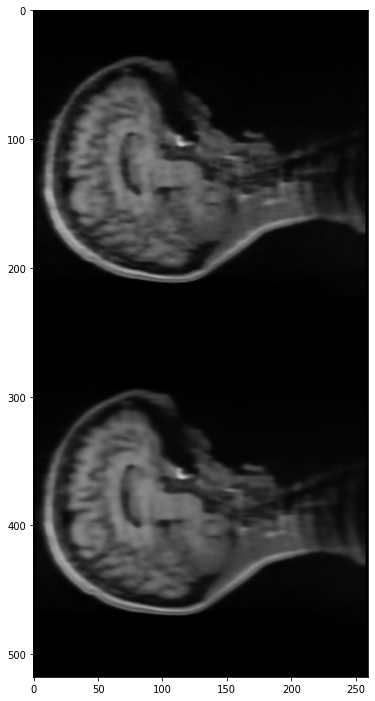

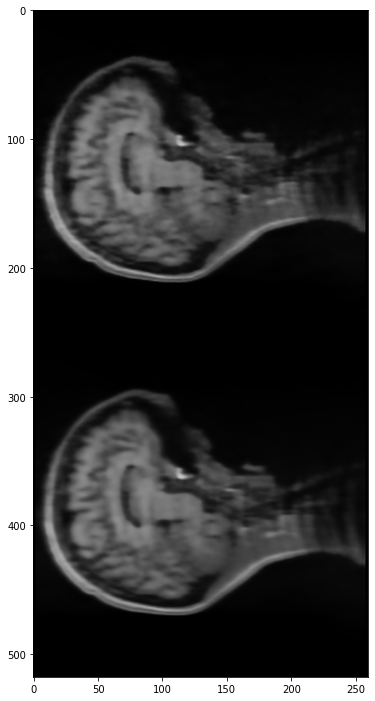

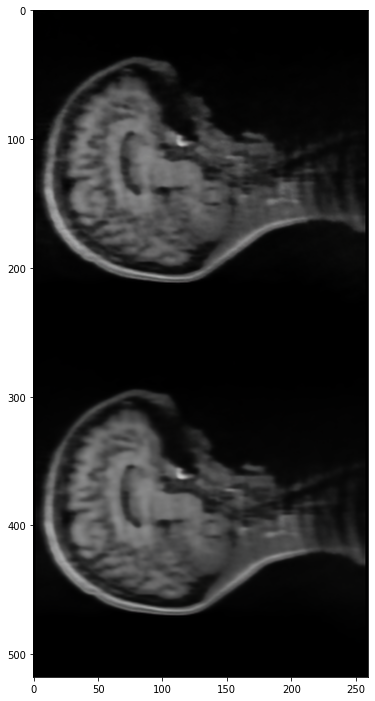

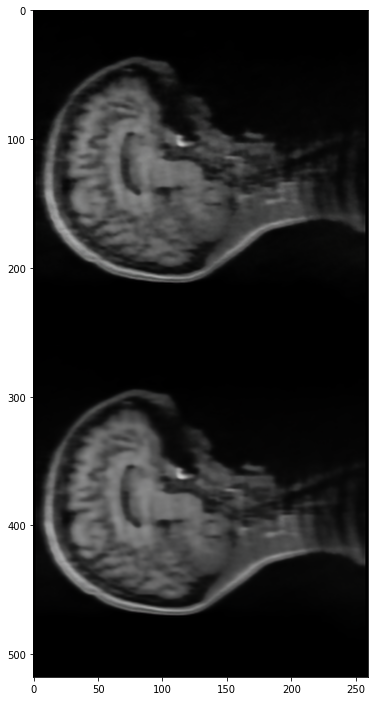

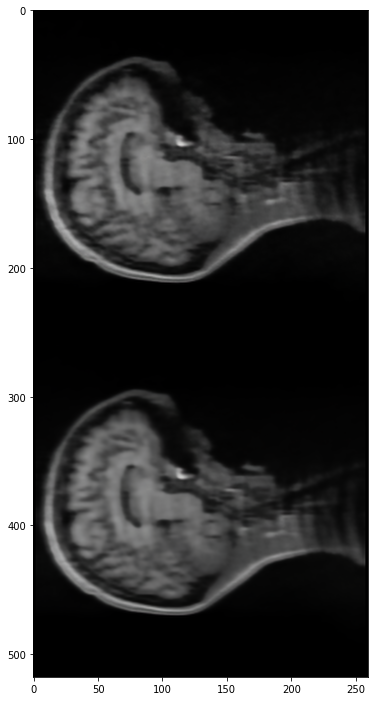

In [22]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

i = 0
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
    
    tanvi = out.detach().cpu().numpy()[0]
    
    psrn_noisy = compare_psnr(img_noisy_np, tanvi[0],data_range = img_noisy_np.min()-img_noisy_np.max())
    psrn_gt    = compare_psnr(img_np, tanvi[0],data_range = img_np.min()-img_np.max()) 
    psrn_gt_sm = compare_psnr(img_np, tanvi[0],data_range = img_np.min()-img_np.max()) 
    
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
    out_np = torch_to_np(out)
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        
        
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


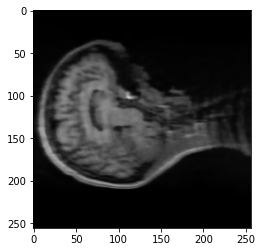

In [23]:
out_np = torch_to_np(net(net_input))
Out=np.zeros((out_np.shape[1],out_np.shape[2],3))
Out[:,:,0]=out_np[0]
Out[:,:,1]=out_np[1]
Out[:,:,2]=out_np[2]
plt.imshow(Out ,cmap='gray')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


Reconstructed image PSNR: 19.606793500809463
Orginal compressed image PSNR: 21.0199225988109
Reconstructed image SSIM: 0.7869919339755925
Orginal compressed image SSIM: 0.8139793644674765


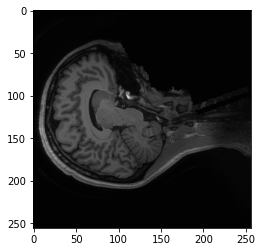

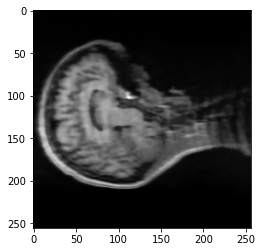

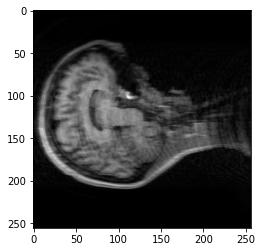

In [24]:
from skimage import color
from skimage import io
import cv2
from skimage.measure import compare_ssim

img_np = cv2.normalize(img_np, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
img = color.rgb2gray(Out)
img = cv2.normalize(img, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
img_noisy_np = cv2.normalize(img_noisy_np, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
plt.figure()
plt.imshow(img_np ,cmap='gray')
plt.figure()
plt.imshow(img ,cmap='gray')
plt.figure()
plt.imshow(img_noisy_np ,cmap='gray')
print("Reconstructed image PSNR:",compare_psnr(img_np, img))
print("Orginal compressed image PSNR:",compare_psnr(img_np, img_noisy_np))
print("Reconstructed image SSIM:",compare_ssim(img_np, img))
print("Orginal compressed image SSIM:",compare_ssim(img_np, img_noisy_np))





Img          255.0 0.0
Original Lap 353.59912 -239.8032
Scaled Lap   100.00001 -67.81782
SharpImg     345.8592 -56.14363
SharpImg abs 345.8592 9.349151e-09
SharpImg after scaling 255.0 6.893075e-09


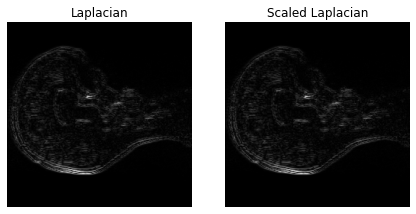

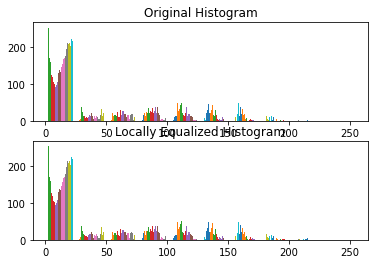

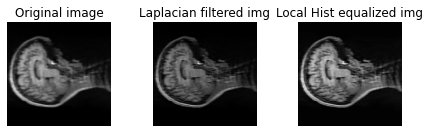

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import scipy.misc
import scipy.ndimage.filters
import cv2

#Function for plotting abs:
pic_n       = 1
def show_abs(I, plot_title):
    plt.title(plot_title)
    plt.tight_layout()
    plt.axis('off')
    plt.imshow(abs(I), cm.gray)

#Reading of the image into numpy array:
A0           = img
A0          -= np.amin(A0)#map values to the (0, 255) range
A0          *= 255.0/np.amax(A0)
print('Img         ', np.amax(A0), np.amin(A0))
#>>> Img          255.0 0.0

#Kernel for negative Laplacian
kernel      = np.ones((3,3))*(-1)
kernel[1,1] = 8

#Convolution of the image with the kernel:
Lap        = scipy.ndimage.filters.convolve(A0, kernel)

#Laplacian now has negative values
print('Original Lap', np.amax(Lap), np.amin(Lap))
#>>> Original Lap 1151.0 -1166.0

#Map Laplacian to some new range:
Laps        = Lap*100.0/np.amax(Lap) #Sharpening factor!
print('Scaled Lap  ', np.amax(Laps), np.amin(Laps))
#>>> Scaled Lap   100.0 -101.303

plt.figure(pic_n)
pic_n += 1
plt.subplot(1,2,1)
show_abs(Lap, 'Laplacian')
plt.subplot(1,2,2)
show_abs(Laps, 'Scaled Laplacian')

A           = A0 + Laps #Add negative Laplacian to the original image

print('SharpImg    ', np.amax(A), np.amin(A))
#>>> SharpImg     350.917 -81.06

A = abs(A) #Get rid of negative values
print('SharpImg abs', np.amax(A), np.amin(A))

A           *= 255.0/np.amax(A)
print('SharpImg after scaling', np.amax(A), np.amin(A))
#>>> SharpImg abs 350.917 0.0

# Local Histogram Equalization with OpenCV:
A_cv2       = A
A_cv2       = A_cv2.astype(np.uint8)

tile_s0     = 4
tile_s1     = 4

clahe       = cv2.createCLAHE(clipLimit=1, tileGridSize=(tile_s0,tile_s1))
A_cv2       = clahe.apply(A_cv2)

plt.figure(pic_n)
pic_n += 1
plt.subplot(2,1,1)
plt.hist(A_cv2)
plt.title('Original Histogram')
plt.subplot(2,1,2)
plt.hist(A_cv2)
plt.title('Locally Equalized Histogram')

plt.figure(pic_n)
pic_n += 1
plt.subplot(1,3,1)
show_abs(A0, 'Original image')
plt.subplot(1,3,2)
show_abs(A, 'Laplacian filtered img')
plt.subplot(1,3,3)
show_abs(A_cv2, 'Local Hist equalized img')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


Reconstructed image PSNR: 26.0377976696528
Orginal compressed image PSNR: 21.0199225988109
Reconstructed image SSIM: 0.8385916188892807
Orginal compressed image SSIM: 0.8139793644674765


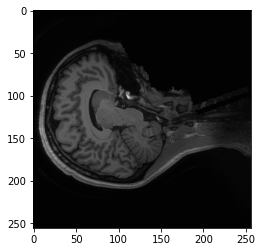

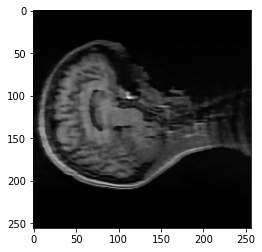

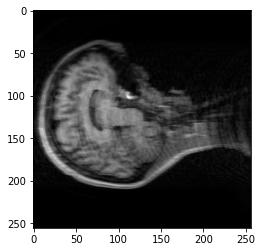

In [26]:
from skimage import color
from skimage import io
import cv2
from skimage.measure import compare_ssim

img_np = cv2.normalize(img_np, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
img = color.rgb2gray(Out)
img = cv2.normalize(A, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
img_noisy_np = cv2.normalize(img_noisy_np, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
plt.figure()
plt.imshow(img_np ,cmap='gray')
plt.figure()
plt.imshow(img ,cmap='gray')
plt.figure()
plt.imshow(img_noisy_np ,cmap='gray')
print("Reconstructed image PSNR:",compare_psnr(img_np, img))
print("Orginal compressed image PSNR:",compare_psnr(img_np, img_noisy_np))
print("Reconstructed image SSIM:",compare_ssim(img_np, img))
print("Orginal compressed image SSIM:",compare_ssim(img_np, img_noisy_np))



